## Self-Implemented Harris Corner Detection

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, feature, data, filters
from scipy import ndimage
import os

In [13]:
def my_harris_corner_detector(image, k=0.04, window_size=5, threshold=0.005, min_distance=10, sigma=1.5, apply_subpixel=True):
    
    if image.ndim == 3:
        gray = color.rgb2gray(image)
    else:
        gray = image.copy()
    
    # 1. Compute image gradients using Sobel operators
    # Apply Gaussian blur to reduce noise (pre-smoothing)
    gray_smoothed = filters.gaussian(gray, sigma=sigma)
    
    # Sobel operators
    Ix = ndimage.sobel(gray_smoothed, axis=1)
    Iy = ndimage.sobel(gray_smoothed, axis=0)
    
    # 2. Compute products of derivatives for each pixel
    Ix2 = Ix * Ix
    Iy2 = Iy * Iy
    Ixy = Ix * Iy
    
    # 3. Compute the sum of products for each pixel in a window
    # Apply Gaussian window
    gaussian_kernel = ndimage.gaussian_filter(np.ones((window_size, window_size)), sigma=window_size/6)
    gaussian_kernel /= np.sum(gaussian_kernel)  # Normalize
    
    # Sum of products using Gaussian weights
    Sxx = ndimage.convolve(Ix2, gaussian_kernel)
    Syy = ndimage.convolve(Iy2, gaussian_kernel)
    Sxy = ndimage.convolve(Ixy, gaussian_kernel)
    
    # 4. Calculate Harris response
    det_M = Sxx * Syy - Sxy**2
    trace_M = Sxx + Syy
    response = det_M - k * trace_M**2
    
    # 5. Apply thresholding and non-maximum suppression
    # Threshold
    response_threshold = response.copy()
    response_threshold[response < threshold * np.max(response)] = 0
    
    # Non-maximum suppression
    coordinates = []
    height, width = response_threshold.shape
    
    for y in range(min_distance, height - min_distance):
        for x in range(min_distance, width - min_distance):
            if response_threshold[y, x] > 0:
                # Get the window around the pixel
                window = response_threshold[y-min_distance:y+min_distance+1, x-min_distance:x+min_distance+1]
                # Check if the pixel is a local maximum
                if response_threshold[y, x] == np.max(window):
                    coordinates.append((y, x))
    
    corners = np.array(coordinates)
    
    # 6. Apply subpixel location correction
    if apply_subpixel and len(corners) > 0:
        refined_corners = []
        
        for y, x in corners:
            # Skip points too close to the image boundary
            if y < 1 or y >= height-1 or x < 1 or x >= width-1:
                refined_corners.append((y, x))
                continue
                
            # Get 3x3 patch around the corner
            patch = response[y-1:y+2, x-1:x+2]
            
            # Calculate derivatives
            dx = (patch[1, 2] - patch[1, 0]) / 2.0
            dxx = (patch[1, 2] - 2 * patch[1, 1] + patch[1, 0])
            dy = (patch[2, 1] - patch[0, 1]) / 2.0
            dyy = (patch[2, 1] - 2 * patch[1, 1] + patch[0, 1])
            dxy = (patch[2, 2] - patch[2, 0] - patch[0, 2] + patch[0, 0]) / 4.0
            
            # Critical point of quadratic surface
            det = dxx * dyy - dxy * dxy
            
            if abs(det) > 1e-10:  # Avoid division by near-zero
                # Compute offsets
                delta_x = (dy * dxy - dx * dyy) / det
                delta_y = (dx * dxy - dy * dxx) / det
                
                # prevent extreme values
                delta_x = np.clip(delta_x, -0.5, 0.5)
                delta_y = np.clip(delta_y, -0.5, 0.5)
                
                # Apply offsets
                refined_corners.append((y + delta_y, x + delta_x))
            else:
                refined_corners.append((y, x))
        
        corners = np.array(refined_corners)
    
    return corners, response

Processing: Astronaut


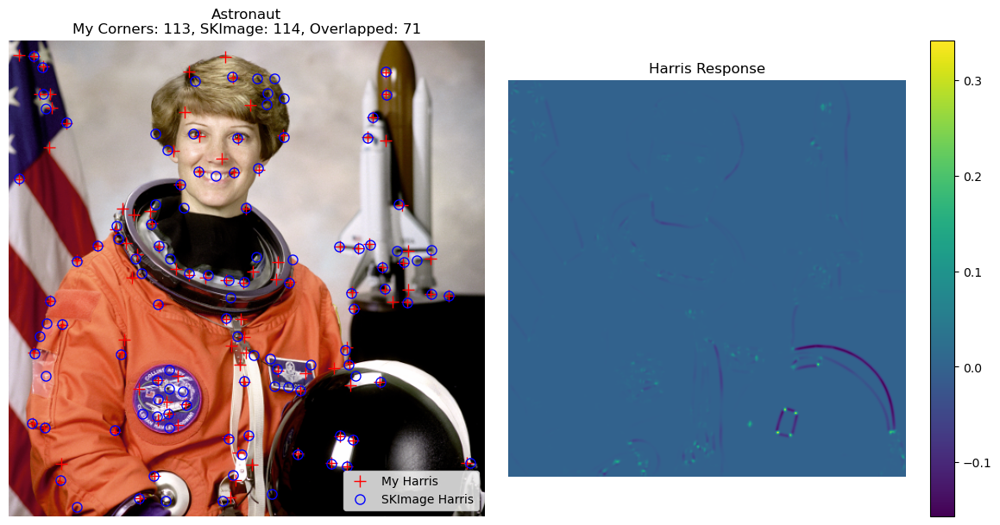

Processing: Checkerboard


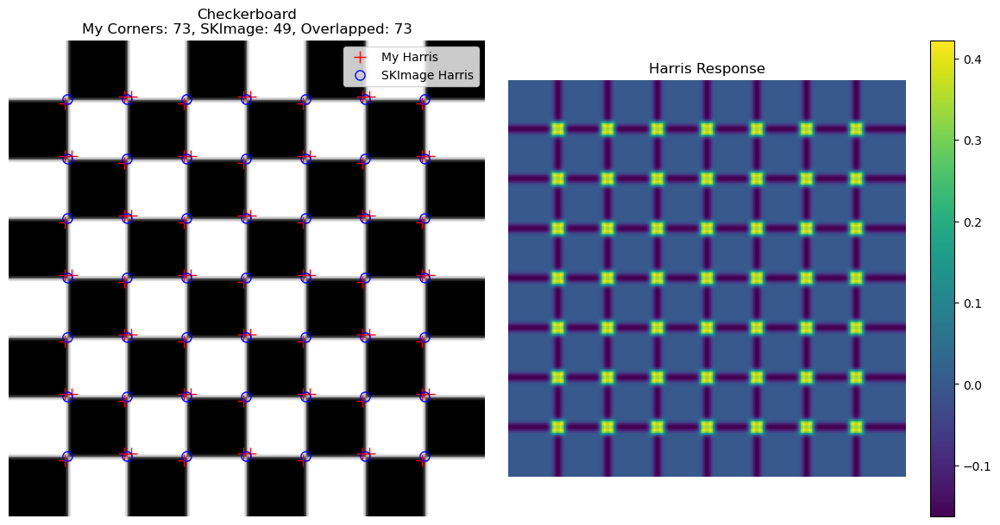

Processing: castle_1.jpg


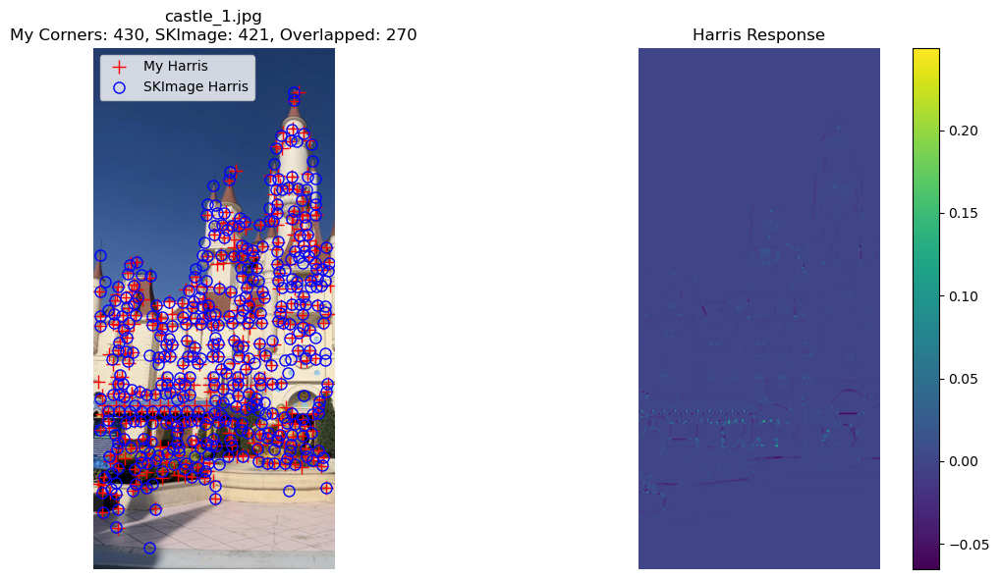

Processing: castle_2.jpg


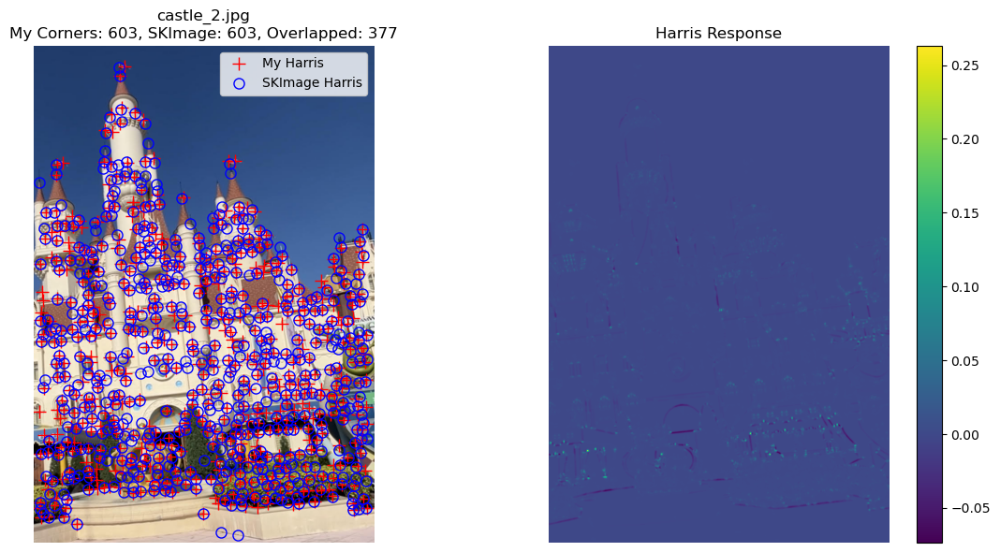

Processing: singapore_1.jpg


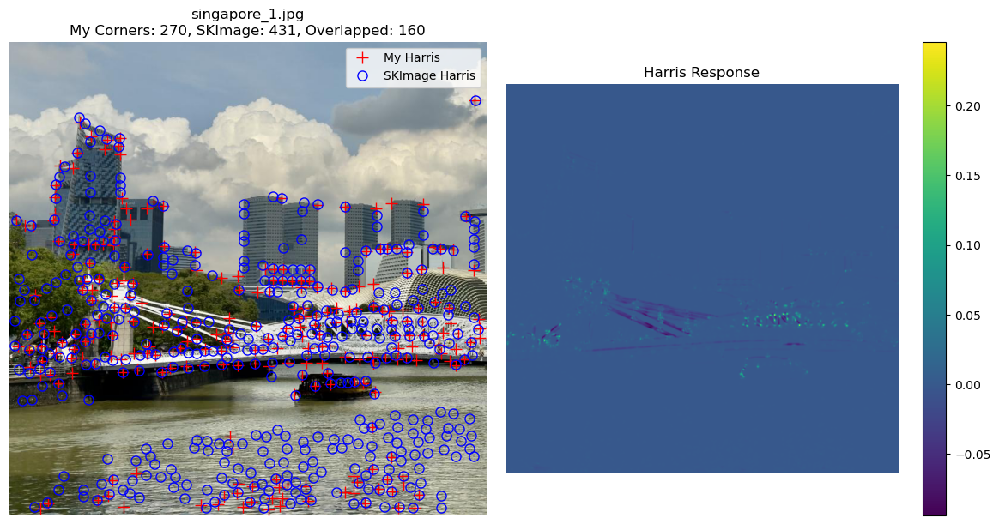

Processing: singapore_2.jpg


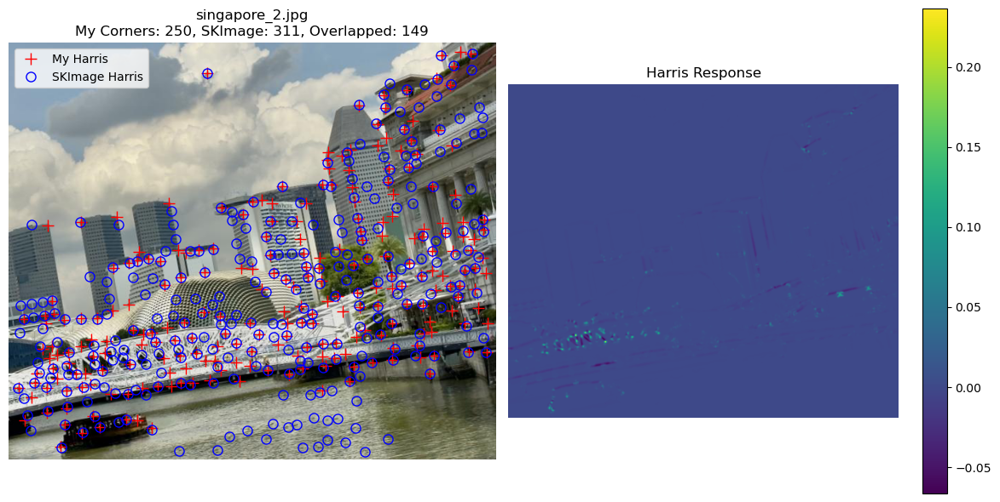

In [14]:
# Function to process and visualize results
def process_and_visualize(image, title):
    print(f"Processing: {title}")

    if image.ndim == 3:
        gray = color.rgb2gray(image)
    else:
        gray = image.copy()
    
    my_corners, my_response = my_harris_corner_detector(image = gray)
    
    # Apply skimage's Harris corner detector for comparison
    harris_response = feature.corner_harris(gray, k=0.04, sigma=1.5)
    skimage_corners = feature.corner_peaks(
        harris_response, min_distance=10, threshold_rel=0.005
    )
    
    # Count overlapping corners
    overlapped = 0
    if len(my_corners) > 0 and len(skimage_corners) > 0:
        for my_y, my_x in my_corners:
            for sk_y, sk_x in skimage_corners:
                # If the distance between corners is small enough, consider them overlapped
                if np.sqrt((my_y - sk_y)**2 + (my_x - sk_x)**2) < 5:
                    overlapped += 1
                    break
    
    # Visualization
    plt.figure(figsize=(12, 6))
    
    # Plot the original image with corners
    plt.subplot(1, 2, 1)
    plt.title(f"{title}\nMy Corners: {len(my_corners)}, SKImage: {len(skimage_corners)}, Overlapped: {overlapped}")
    plt.imshow(image, cmap='gray' if image.ndim == 2 else None)
    
    # Plot my corners with red + markers
    if len(my_corners) > 0:
        plt.plot(my_corners[:, 1], my_corners[:, 0], 'r+', markersize=10, label='My Harris')
    
    # Plot skimage corners with blue o markers
    if len(skimage_corners) > 0:
        plt.plot(skimage_corners[:, 1], skimage_corners[:, 0], 'bo', markersize=8, fillstyle='none', label='SKImage Harris')
    
    plt.legend()
    plt.axis('off')
    
    # Plot the Harris response
    plt.subplot(1, 2, 2)
    plt.title('Harris Response')
    plt.imshow(my_response, cmap='viridis')
    plt.colorbar()
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Test the `my_harris_corner_detector` function with the 6 required images

# 1. skimage.data.astronaut()
astronaut = data.astronaut()
process_and_visualize(astronaut, "Astronaut")

# 2. skimage.data.checkerboard()
checkerboard = data.checkerboard()
process_and_visualize(checkerboard, "Checkerboard")

# 3-6. Load external images
image_files = ['castle_1.jpg', 'castle_2.jpg', 'singapore_1.jpg', 'singapore_2.jpg']

for image_file in image_files:
    try:
        image = io.imread(image_file)
        process_and_visualize(image, image_file)
    except (FileNotFoundError, OSError):
        print(f"Warning: The file {image_file} was not found or couldn't be loaded.")


## Self-Implemented Homography Estimation

In [15]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg

In [16]:
def my_homography_estimation(X1, X2):
    
    # Check if we have enough points (need at least 4)
    if X1.shape[0] < 4 or X2.shape[0] < 4:
        raise ValueError("At least 4 point correspondences are required to estimate homography")
    
    n = X1.shape[0]
    
    # Build the coefficient matrix A
    A = np.zeros((2*n, 9))
    
    # For each point correspondence, build the two rows of A
    for i in range(n):
        x1, y1 = X1[i]
        x2, y2 = X2[i]
        
        A[2*i] = [x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1, -x2]
        A[2*i+1] = [0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1, -y2]
    
    # Solve Ah = 0 using Singular Value Decomposition (SVD)
    _, _, Vt = np.linalg.svd(A)
    
    h = Vt[-1]
    H = h.reshape(3, 3)
    H = H / H[2, 2]
    
    return H

## Self-Implemented RANSAC

In [17]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg
import random

In [18]:
def my_ransac(P1, P2, max_iterations=1000, distance_threshold=5.0, min_inliers=4):

    # Check input
    if P1.shape != P2.shape:
        raise ValueError("P1 and P2 must have the same shape")
    
    if P1.shape[0] < 4:
        raise ValueError("At least 4 point correspondences are required")
    
    n_points = P1.shape[0]
    best_inliers = []
    best_H = None
    
    # Set random seed for reproducibility
    np.random.seed(42)
    random.seed(42)
    
    # RANSAC iterations
    for iteration in range(max_iterations):
        # 1. Randomly select minimum subset of points (4 for homography)
        sample_indices = random.sample(range(n_points), 4)
        
        # 2. Estimate model from this minimal subset
        X1 = P1[sample_indices]
        X2 = P2[sample_indices]
        
        try:
            H = my_homography_estimation(X1, X2)
        except Exception as e:
            continue
        
        # 3. Find inliers
        inliers = []
        
        for i in range(n_points):
            error = compute_error(H, P1[i], P2[i])
            if error < distance_threshold:
                inliers.append(i)
        
        # 4. If this model has more inliers, update the best model
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_H = H
        
        print(f"Iteration {iteration+1}: {len(inliers)} inliers, {n_points - len(inliers)} outliers")
        
        # If we found a model with sufficient inliers, refine it using all inliers
        if len(inliers) >= min_inliers:
            try:
                # Refine homography using all inliers
                refined_H = my_homography_estimation(P1[inliers], P2[inliers])
                
                # Recompute inliers with refined model
                refined_inliers = []
                for i in range(n_points):
                    error = compute_error(refined_H, P1[i], P2[i])
                    if error < distance_threshold:
                        refined_inliers.append(i)
                
                # Update best model if refined model has more inliers
                if len(refined_inliers) > len(best_inliers):
                    best_inliers = refined_inliers
                    best_H = refined_H
            except Exception as e:
                pass
    
    # If we didn't find any good model, return None
    if best_H is None:
        print("RANSAC failed to find a good homography.")
        return None
    
    print(f"\nFinal result: {len(best_inliers)} inliers, {n_points - len(best_inliers)} outliers")
    print("\nInlier matches:")
    for i in best_inliers:
        print(f"P1: {P1[i]} -> P2: {P2[i]}")
    
    return best_H, best_inliers


def compute_error(H, p1, p2):
    
    # Convert p1 to homogeneous coordinates
    p1_homogeneous = np.array([p1[0], p1[1], 1.0])
    
    # Transform p1 using homography H
    p1_transformed_homogeneous = H @ p1_homogeneous
    
    # Convert back to inhomogeneous coordinates
    if p1_transformed_homogeneous[2] == 0:
        # Handle division by zero
        return float('inf')
    
    p1_transformed = p1_transformed_homogeneous[:2] / p1_transformed_homogeneous[2]
    
    # Compute Euclidean distance
    error = np.sqrt(np.sum((p1_transformed - p2)**2))
    
    return error

In [19]:
# Test `my_ransac`  with P1, P2 as below
import numpy as np
P1 = np.asarray([[428, 171],
                [547, 137],
                [60,  90],
                [397, 208],
                [521, 224],
                [563, 333],
                [507, 178],
                [476, 277],
                [180, 353],
                [543, 307],
                [531, 98]])
P2 = np.asarray([[51, 152],
                [162, 98],
                [162,  98],
                [27, 194],
                [152, 189],
                [51, 152],
                [130, 145],
                [117, 248],
                [26, 434],
                [188, 266],
                [140, 63]])

result = my_ransac(P1, P2)

if result is not None:
    H, inliers = result
    print("\nBest Transformation matrix: ")
    print(f"[[{H[0, 0]:.6f}, {H[0, 1]:.6f}, {H[0, 2]:.6f}], \n [{H[1, 0]:.6f}, {H[1, 1]:.6f}, {H[1, 2]:.6f}], \n [{H[2, 0]:.6f}, {H[2, 1]:.6f}, {H[2, 2]:.6f}]]")

Iteration 1: 8 inliers, 3 outliers
Iteration 2: 2 inliers, 9 outliers
Iteration 3: 4 inliers, 7 outliers
Iteration 4: 5 inliers, 6 outliers
Iteration 5: 4 inliers, 7 outliers
Iteration 6: 4 inliers, 7 outliers
Iteration 7: 8 inliers, 3 outliers
Iteration 8: 4 inliers, 7 outliers
Iteration 9: 3 inliers, 8 outliers
Iteration 10: 4 inliers, 7 outliers
Iteration 11: 2 inliers, 9 outliers
Iteration 12: 4 inliers, 7 outliers
Iteration 13: 4 inliers, 7 outliers
Iteration 14: 8 inliers, 3 outliers
Iteration 15: 7 inliers, 4 outliers
Iteration 16: 7 inliers, 4 outliers
Iteration 17: 5 inliers, 6 outliers
Iteration 18: 4 inliers, 7 outliers
Iteration 19: 4 inliers, 7 outliers
Iteration 20: 4 inliers, 7 outliers
Iteration 21: 4 inliers, 7 outliers
Iteration 22: 2 inliers, 9 outliers
Iteration 23: 7 inliers, 4 outliers
Iteration 24: 4 inliers, 7 outliers
Iteration 25: 4 inliers, 7 outliers
Iteration 26: 4 inliers, 7 outliers
Iteration 27: 4 inliers, 7 outliers
Iteration 28: 4 inliers, 7 outliers
I

## Image stitching

The image stitching pipeline integrates all previous tasks to create panoramas from overlapping images.

### Implementation Steps
1. **Feature detection**: Apply Harris corner detector on equalized images
2. **Feature description**: Extract SIFT descriptors at corner locations
3. **Feature matching**: Use FLANN-based matching with ratio test (threshold=0.8)
4. **Robust estimation**: Apply RANSAC to find homography between images
5. **Image warping**: Transform second image to align with first
6. **Boundary determination**: Calculate output dimensions using transformed corners
7. **Blending**: Create seamless transitions in overlapping regions


Test `my_image_stitching` function with three pair of input images:
- First test input:
  - image 1 is `castle_1.jpg`
  - image 2 is `castle_2.jpg`
  - Generate a stitched image from `image 1` and `image 2`, save this image under `stitched_castle.jpg`

- Second test input:
  - image 1 is `singapore_1.jpg`
  - image 2 is `singapore_2.jpg`.
  - Generate a stitched image from `image 1` and `image 2`, save this image under `stitched_singapore.jpg`

- Third test input:
  - image 1 is `monash_building_1.jpg`
  - image 2 is `monash_building_1.jpg`.
  - Generate a stitched image from `image 1` and `image 2`, save this image under `stitched_monash.jpg`

To write an image as a file, you can use function `skimage.io.imsave(image_name, stitched_image)`

In [20]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, feature, exposure, util, filters
from scipy import ndimage
import cv2

In [21]:
# Helper function to visualize matching keypoints of image 1 and image 2
def visualize_matches(img1, img2, kp1=None, kp2=None, gap=50, lw=3, title="Matching keypoints"):
  '''
    kp1, kp2 is a list coordination of keypoints with size of Nx2

  '''
  large_image = np.zeros((max(img1.shape[0], img2.shape[0]), img1.shape[1] + img2.shape[1] + gap, 3), dtype=np.uint8)
  start_img2 = img1.shape[1] + gap

  large_image[:img1.shape[0], :img1.shape[1]] = img1
  large_image[:img2.shape[0], start_img2:start_img2+img2.shape[1]] = img2
  plt.figure(figsize=(10,10))
  plt.imshow(large_image)
  plt.title("{}\nImage 1                                              Image 2".format(title))
  for p1, p2 in zip(kp1, kp2):
    x = [p1[0], p2[0]+start_img2]    # because location x of image 2 is shifted `start_img2` to the right
    y = [p1[1], p2[1]]
    plt.plot(x, y, linewidth=lw)
  plt.show()

In [22]:
def my_image_stitching(img1, img2, output_filename=None):
    
    # Convert images to RGB if needed
    if img1.ndim == 2:
        img1 = np.dstack([img1, img1, img1])
    if img2.ndim == 2:
        img2 = np.dstack([img2, img2, img2])
        
    # Ensure images are of type uint8
    if img1.dtype != np.uint8:
        img1 = np.clip(img1 * 255, 0, 255).astype(np.uint8)
    if img2.dtype != np.uint8:
        img2 = np.clip(img2 * 255, 0, 255).astype(np.uint8)

    # Create grayscale versions for feature detection
    gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY) if img1.shape[2] == 3 else img1
    gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY) if img2.shape[2] == 3 else img2
    
    # Step 1: Detect key points with enhanced Harris corner detector
    print("Step 1: Detecting keypoints...")
    
    # Apply histogram equalization for better feature detection
    gray1_eq = exposure.equalize_hist(gray1)
    gray2_eq = exposure.equalize_hist(gray2)
    
    # Detect corners with optimized parameters
    harris_corners1, _ = my_harris_corner_detector(
        gray1_eq, k=0.04, threshold=0.005, min_distance=10, sigma=1.5
    )
    
    harris_corners2, _ = my_harris_corner_detector(
        gray2_eq, k=0.04, threshold=0.005, min_distance=10, sigma=1.5
    )

    # Convert corners to KeyPoint objects for SIFT descriptor extraction
    keypoints1 = [cv2.KeyPoint(x=float(pt[1]), y=float(pt[0]), size=10) for pt in harris_corners1]
    keypoints2 = [cv2.KeyPoint(x=float(pt[1]), y=float(pt[0]), size=10) for pt in harris_corners2]
    
    print(f"Found {len(keypoints1)} keypoints in image 1")
    # Visualization for img1
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 2, 1)
    plt.title('Original Image 1')
    plt.imshow(img1)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title("Detected Corners")
    plt.imshow(img1, cmap='gray' if image.ndim == 2 else None)
    if len(harris_corners1) > 0:
        plt.plot(harris_corners1[:, 1], harris_corners1[:, 0], 'r+', markersize=10)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    print(f"Found {len(keypoints2)} keypoints in image 2")
    # Visualization for img2
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 2, 1)
    plt.title('Original Image 2')
    plt.imshow(img2)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title("Detected Corners")
    plt.imshow(img2, cmap='gray' if image.ndim == 2 else None)
    if len(harris_corners2) > 0:
        plt.plot(harris_corners2[:, 1], harris_corners2[:, 0], 'r+', markersize=10)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Step 2: Extract local descriptors with SIFT
    print("Step 2: Extracting SIFT descriptors...")
    sift = cv2.SIFT_create(nfeatures=3000, contrastThreshold=0.04)
    
    # Compute descriptors
    _, descriptors1 = sift.compute(gray1, keypoints1)
    _, descriptors2 = sift.compute(gray2, keypoints2)
    
    if descriptors1 is None or descriptors2 is None:
        print("Failed to extract descriptors")
        return None
    
    # Step 3: Match keypoints with improved matching
    print("Step 3: Matching keypoints...")
    # Use FLANN matcher which is faster than BFMatcher for larger datasets
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=8)
    search_params = dict(checks=100)  # More checks = more accurate but slower
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Find 2 best matches for each descriptor
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    
    # Apply ratio test (Lowe's test) with adaptive threshold
    good_matches = []
    ratio_threshold = 0.8  # Start with a looser threshold
    
    for m, n in matches:
        ratio = m.distance / n.distance if n.distance > 0 else 1.0
        if ratio < ratio_threshold:
            good_matches.append(m)
    
    # If too few matches, try a more permissive threshold
    if len(good_matches) < 20:
        good_matches = []
        ratio_threshold = 0.85
        for m, n in matches:
            ratio = m.distance / n.distance if n.distance > 0 else 1.0
            if ratio < ratio_threshold:
                good_matches.append(m)
    
    # Sort by distance
    good_matches = sorted(good_matches, key=lambda x: x.distance)
    
    # Limit number of matches for visualization
    num_matches_to_show = min(50, len(good_matches))
    matches_to_show = good_matches[:num_matches_to_show]
    
    print(f"Found {len(good_matches)} good matches after ratio test")
    
    # Extract points from good matches
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])
    
    # Visualize all matches
    print("Visualizing good matches...")
    kp1_vis = np.float32([keypoints1[m.queryIdx].pt for m in matches_to_show])
    kp2_vis = np.float32([keypoints2[m.trainIdx].pt for m in matches_to_show])
    visualize_matches(img1, img2, kp1_vis, kp2_vis, title="Good keypoint matches")
    
    # Step 4: Estimate the homography matrix using improved RANSAC
    print("Step 4: Estimating homography with RANSAC...")
    
    H, inliers = my_ransac(
        dst_pts, src_pts, 
        max_iterations=1000, 
        distance_threshold=3.0, 
        min_inliers=8
    )

    if H is None or len(inliers) < 4:
        print("Failed to find a good homography")
        return None
    
    # Get inlier matches
    inlier_matches = [good_matches[i] for i in inliers]
    print(f"Found {len(inlier_matches)} inliers out of {len(good_matches)} matches")
    
    # Visualize inlier matches
    print("Visualizing inlier matches...")
    inlier_src_pts = np.float32([keypoints1[m.queryIdx].pt for m in inlier_matches])
    inlier_dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in inlier_matches])
    
    # Only show a subset of inliers if there are too many
    max_inliers_to_show = min(50, len(inlier_matches))
    inlier_src_vis = inlier_src_pts[:max_inliers_to_show]
    inlier_dst_vis = inlier_dst_pts[:max_inliers_to_show]
    visualize_matches(img1, img2, inlier_src_vis, inlier_dst_vis, title="Inlier matches")
    
    # Step 5: Apply warping transformation with improved boundary estimation
    print("Step 5: Applying warping transformation...")
    
    # Get image dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Get the corners of both images
    corners1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    
    # Add more points along the edges for better boundary estimation
    edge_points1 = []
    edge_points2 = []
    
    # Add points along the edges of image 1
    num_edge_points = 20
    for i in range(1, num_edge_points):
        edge_points1.append([[i * w1 / num_edge_points, 0]])
        edge_points1.append([[i * w1 / num_edge_points, h1]])
        edge_points1.append([[0, i * h1 / num_edge_points]])
        edge_points1.append([[w1, i * h1 / num_edge_points]])
    
    # Add points along the edges of image 2
    for i in range(1, num_edge_points):
        edge_points2.append([[i * w2 / num_edge_points, 0]])
        edge_points2.append([[i * w2 / num_edge_points, h2]])
        edge_points2.append([[0, i * h2 / num_edge_points]])
        edge_points2.append([[w2, i * h2 / num_edge_points]])
    
    # Combine corner points and edge points
    all_points1 = np.concatenate((corners1, np.float32(edge_points1)), axis=0)
    all_points2 = np.concatenate((corners2, np.float32(edge_points2)), axis=0)
    
    # Transform corners and edge points of image 2 to image 1 space
    transformed_points2 = cv2.perspectiveTransform(all_points2, H)
    
    # Combine all points to find the extent of the output image
    all_transformed_points = np.concatenate((all_points1, transformed_points2), axis=0)
    
    # Find min and max x, y coordinates with padding
    min_x, min_y = np.int32(np.min(all_transformed_points, axis=0).ravel()) - 5
    max_x, max_y = np.int32(np.max(all_transformed_points, axis=0).ravel()) + 5
    
    # Calculate translation offset
    translation = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])
    
    # Combine translation with homography
    H_translation = translation @ H
    
    # Calculate output dimensions
    output_width = max_x - min_x
    output_height = max_y - min_y
    
    # Step 6: Merge images with improved blending
    print("Step 6: Merging images with advanced blending...")
    
    # Create panorama canvas
    panorama = np.zeros((output_height, output_width, 3), dtype=np.uint8)
    
    # Warp image 2 onto the panorama
    img2_warped = cv2.warpPerspective(img2, H_translation, (output_width, output_height))
    
    # Calculate the offset for image 1
    offset_x = -min_x
    offset_y = -min_y
    
    # Create mask for image 1 in the panorama
    mask1 = np.zeros((output_height, output_width), dtype=np.uint8)
    
    # Place image 1 in the panorama
    panorama_roi_y1 = max(0, offset_y)
    panorama_roi_y2 = min(output_height, offset_y + h1)
    panorama_roi_x1 = max(0, offset_x)
    panorama_roi_x2 = min(output_width, offset_x + w1)
    
    img1_roi_y1 = max(0, -offset_y)
    img1_roi_y2 = min(h1, output_height - offset_y)
    img1_roi_x1 = max(0, -offset_x)
    img1_roi_x2 = min(w1, output_width - offset_x)
    
    # Copy image 1 into the panorama
    panorama[panorama_roi_y1:panorama_roi_y2, panorama_roi_x1:panorama_roi_x2] = img1[img1_roi_y1:img1_roi_y2, img1_roi_x1:img1_roi_x2]
    
    # Create a mask for image 1
    mask1[panorama_roi_y1:panorama_roi_y2, panorama_roi_x1:panorama_roi_x2] = 255
    
    # Create a distance map for image 1
    inlier_points1_offset = []
    for pt in inlier_src_pts:
        x, y = pt
        inlier_points1_offset.append((int(y + offset_y), int(x + offset_x)))
    
    # Create a blending mask based on distance to matched points
    distance_weight = create_distance_map((output_height, output_width), inlier_points1_offset, max_distance=100)
    
    # Create a gradient mask for smooth blending in the overlapping region
    overlap_mask = (mask1 > 0) & (img2_warped.sum(axis=2) > 0)
    alpha = np.ones((output_height, output_width), dtype=np.float32)
    
    # use a weighted blend based on distance to matched points and smooth transition
    alpha[overlap_mask] = distance_weight[overlap_mask]
    
    # Apply Gaussian blur to the alpha mask
    alpha = ndimage.gaussian_filter(alpha, sigma=15)
    alpha = np.clip(alpha, 0, 1)
    
    # Apply feathering to the boundary
    kernel = np.ones((25, 25), np.uint8)
    border_mask = cv2.dilate(mask1, kernel) - mask1
    
    feather_weight = np.ones_like(alpha)
    feather_weight[border_mask > 0] = 0.5
    alpha = alpha * feather_weight
    
    # Expand alpha from (h,w) to (h,w,1) for broadcasting
    alpha_3ch = np.expand_dims(alpha, axis=2)
    
    # Blend the images using the alpha mask
    blended = (img2_warped * (1 - alpha_3ch) + 
               panorama * alpha_3ch).astype(np.uint8)
    
    # Ensure we keep areas where only one image exists
    only_img1 = (mask1 > 0) & (img2_warped.sum(axis=2) == 0)
    only_img2 = (mask1 == 0) & (img2_warped.sum(axis=2) > 0)
    
    blended[only_img1] = panorama[only_img1]
    blended[only_img2] = img2_warped[only_img2]
    
    # Post-processing: enhance contrast and color
    stitched_image = exposure.rescale_intensity(blended)
    
    # Save the output
    if output_filename:
        cv2.imwrite(output_filename, cv2.cvtColor(stitched_image, cv2.COLOR_RGB2BGR))
        print(f"Saved stitched image to: {output_filename}")
    
    return stitched_image

def create_distance_map(shape, points, max_distance=100):
    """Create a distance map from a set of points"""
    height, width = shape
    y_coords, x_coords = np.mgrid[:height, :width]
    distance_map = np.ones((height, width)) * max_distance
    
    for point in points:
        y, x = point
        # Check if point is within image bounds
        if 0 <= y < height and 0 <= x < width:
            # Calculate Euclidean distance to each point
            curr_dist = np.sqrt((y_coords - y)**2 + (x_coords - x)**2)
            # Update distance map with minimum distance
            distance_map = np.minimum(distance_map, curr_dist)
    
    # Normalize to [0, 1]
    distance_map = np.clip(distance_map / max_distance, 0, 1)
    return distance_map


Testing with castle images...
Step 1: Detecting keypoints...
Found 446 keypoints in image 1


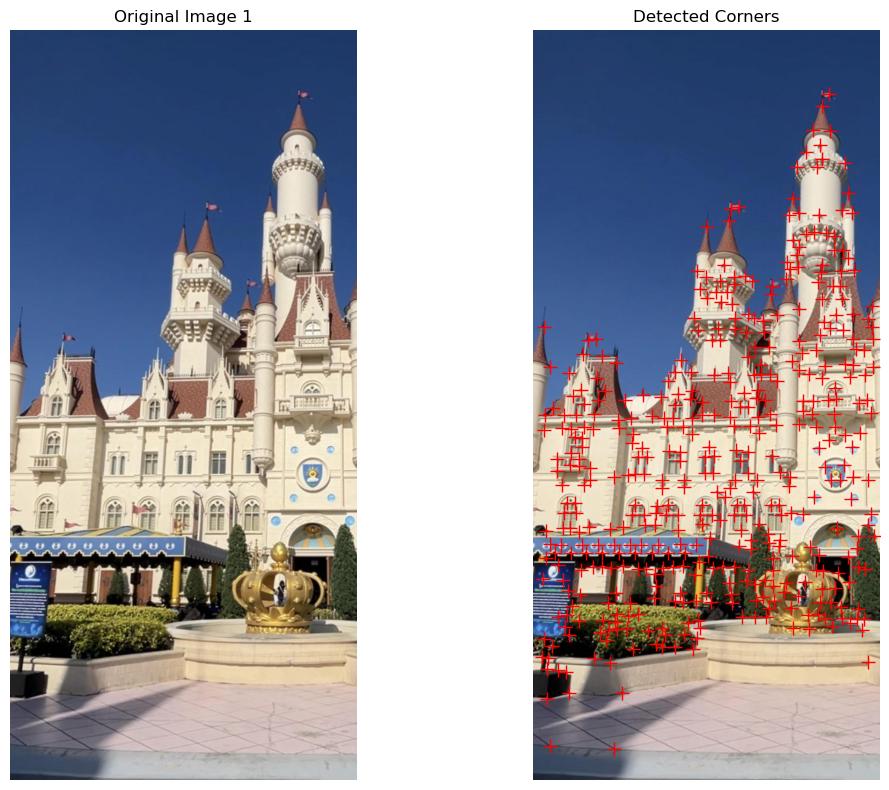

Found 607 keypoints in image 2


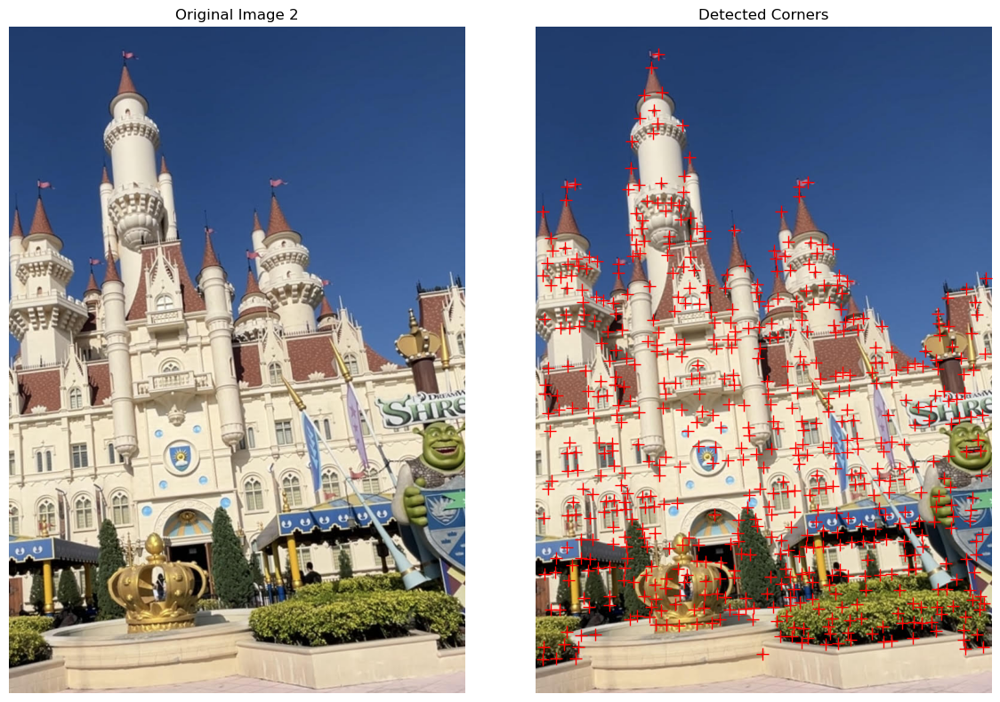

Step 2: Extracting SIFT descriptors...
Step 3: Matching keypoints...
Found 256 good matches after ratio test
Visualizing good matches...


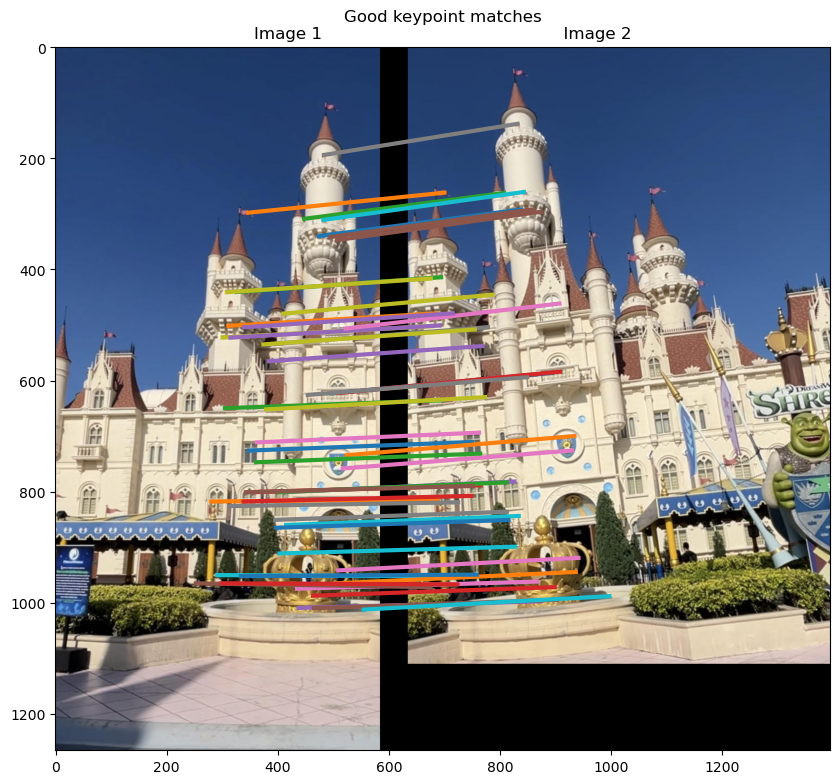

Step 4: Estimating homography with RANSAC...
Iteration 1: 41 inliers, 215 outliers
Iteration 2: 188 inliers, 68 outliers
Iteration 3: 98 inliers, 158 outliers
Iteration 4: 140 inliers, 116 outliers
Iteration 5: 32 inliers, 224 outliers
Iteration 6: 110 inliers, 146 outliers
Iteration 7: 11 inliers, 245 outliers
Iteration 8: 92 inliers, 164 outliers
Iteration 9: 146 inliers, 110 outliers
Iteration 10: 5 inliers, 251 outliers
Iteration 11: 120 inliers, 136 outliers
Iteration 12: 226 inliers, 30 outliers
Iteration 13: 199 inliers, 57 outliers
Iteration 14: 68 inliers, 188 outliers
Iteration 15: 215 inliers, 41 outliers
Iteration 16: 4 inliers, 252 outliers
Iteration 17: 225 inliers, 31 outliers
Iteration 18: 4 inliers, 252 outliers
Iteration 19: 96 inliers, 160 outliers
Iteration 20: 4 inliers, 252 outliers
Iteration 21: 226 inliers, 30 outliers
Iteration 22: 197 inliers, 59 outliers
Iteration 23: 196 inliers, 60 outliers
Iteration 24: 78 inliers, 178 outliers
Iteration 25: 74 inliers, 18

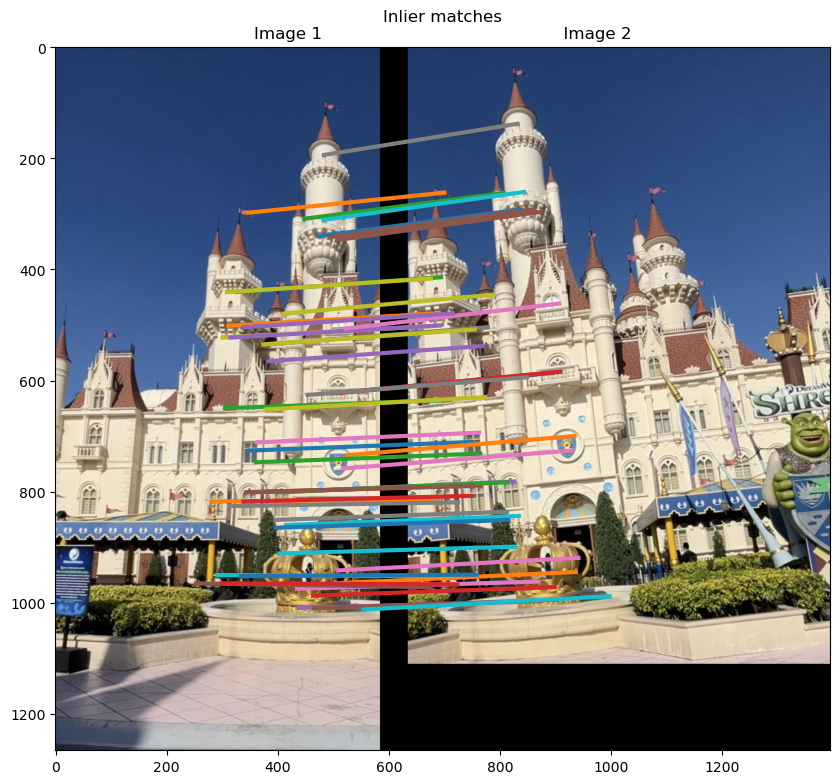

Step 5: Applying warping transformation...
Step 6: Merging images with advanced blending...
Saved stitched image to: stitched_castle.jpg


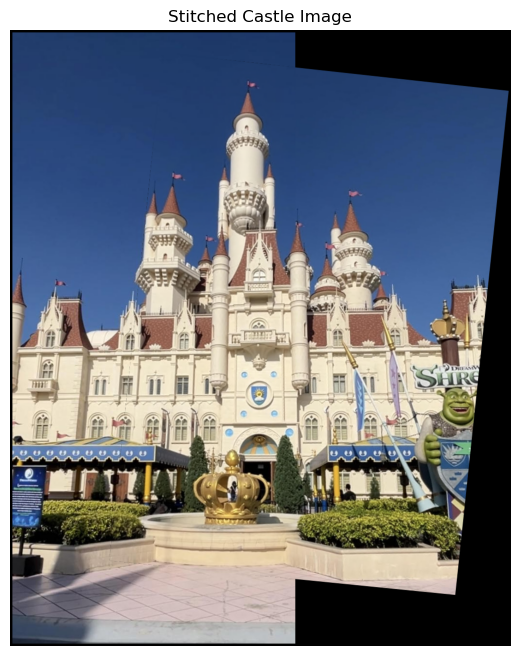


Testing with Singapore images...
Step 1: Detecting keypoints...
Found 349 keypoints in image 1


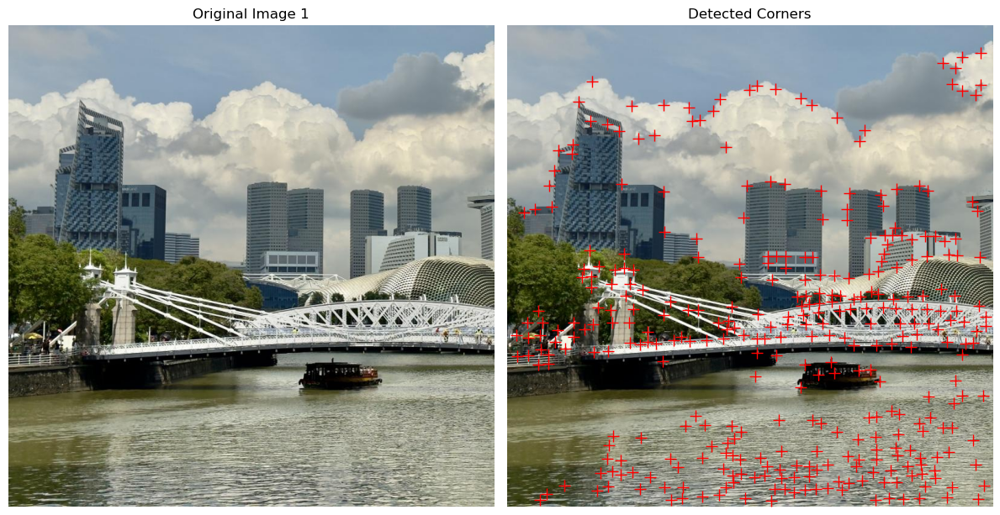

Found 268 keypoints in image 2


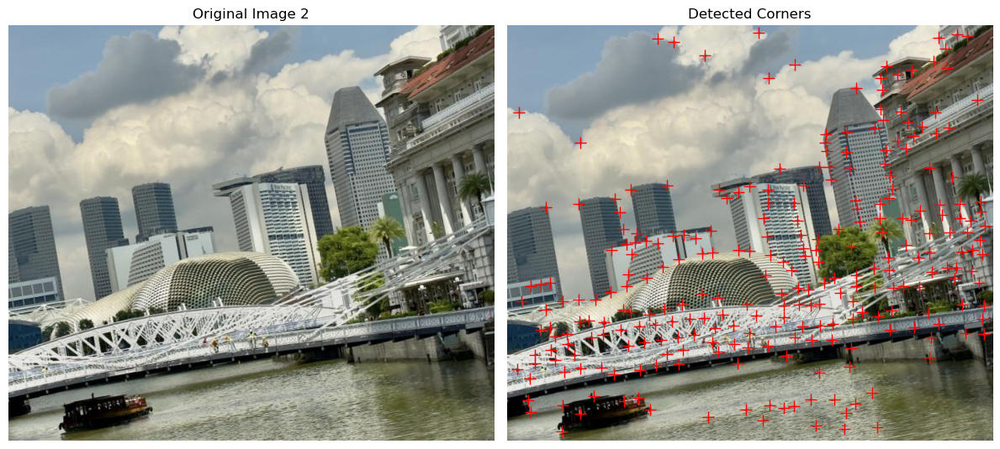

Step 2: Extracting SIFT descriptors...
Step 3: Matching keypoints...
Found 96 good matches after ratio test
Visualizing good matches...


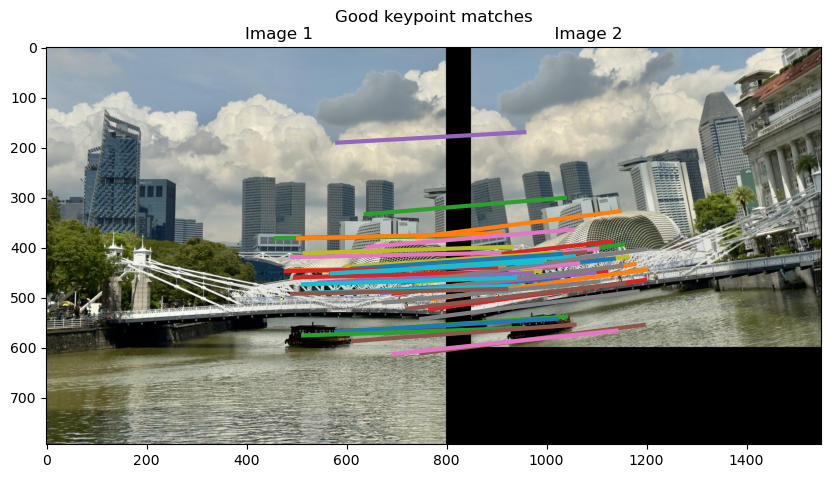

Step 4: Estimating homography with RANSAC...
Iteration 1: 4 inliers, 92 outliers
Iteration 2: 86 inliers, 10 outliers
Iteration 3: 20 inliers, 76 outliers
Iteration 4: 83 inliers, 13 outliers
Iteration 5: 52 inliers, 44 outliers
Iteration 6: 63 inliers, 33 outliers
Iteration 7: 4 inliers, 92 outliers
Iteration 8: 4 inliers, 92 outliers
Iteration 9: 79 inliers, 17 outliers
Iteration 10: 5 inliers, 91 outliers
Iteration 11: 63 inliers, 33 outliers
Iteration 12: 78 inliers, 18 outliers
Iteration 13: 86 inliers, 10 outliers
Iteration 14: 19 inliers, 77 outliers
Iteration 15: 72 inliers, 24 outliers
Iteration 16: 29 inliers, 67 outliers
Iteration 17: 4 inliers, 92 outliers
Iteration 18: 33 inliers, 63 outliers
Iteration 19: 85 inliers, 11 outliers
Iteration 20: 78 inliers, 18 outliers
Iteration 21: 29 inliers, 67 outliers
Iteration 22: 8 inliers, 88 outliers
Iteration 23: 70 inliers, 26 outliers
Iteration 24: 6 inliers, 90 outliers
Iteration 25: 85 inliers, 11 outliers
Iteration 26: 68 inli

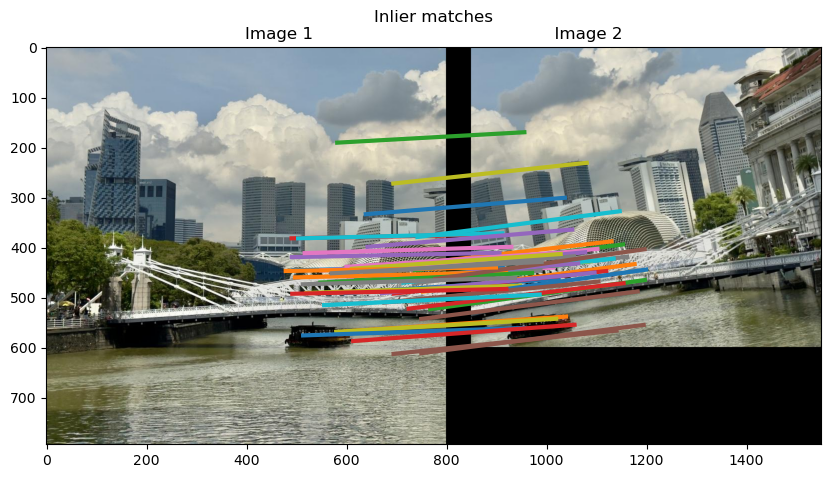

Step 5: Applying warping transformation...
Step 6: Merging images with advanced blending...
Saved stitched image to: stitched_singapore.jpg


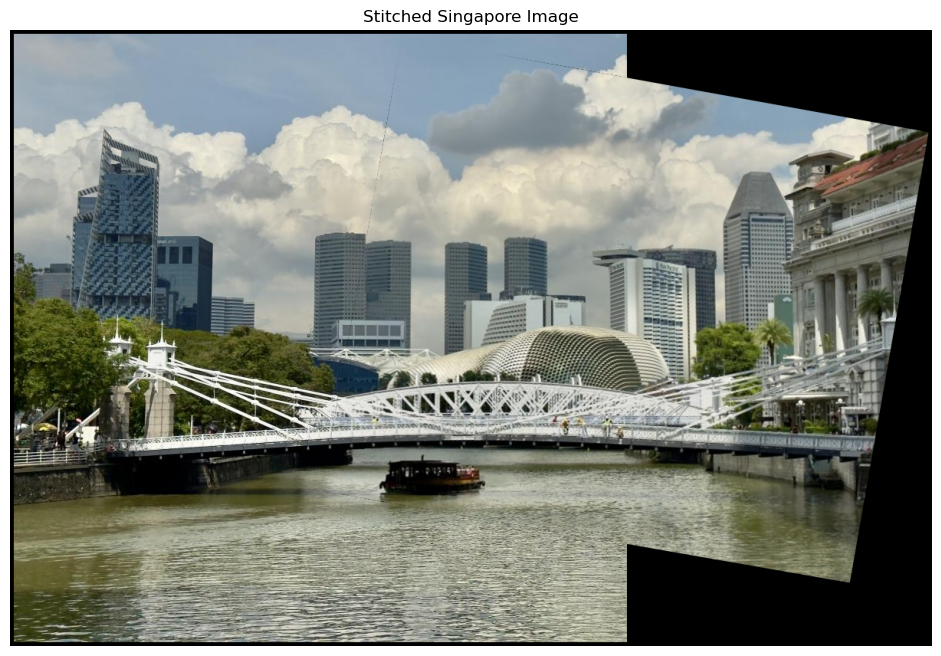


Testing with Monash building images...
Step 1: Detecting keypoints...
Found 270 keypoints in image 1


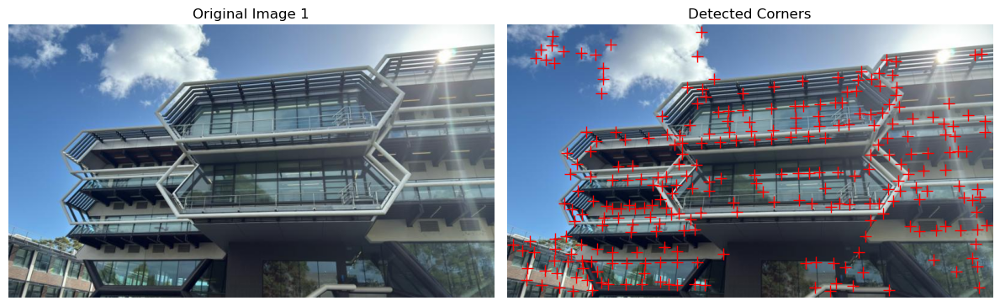

Found 254 keypoints in image 2


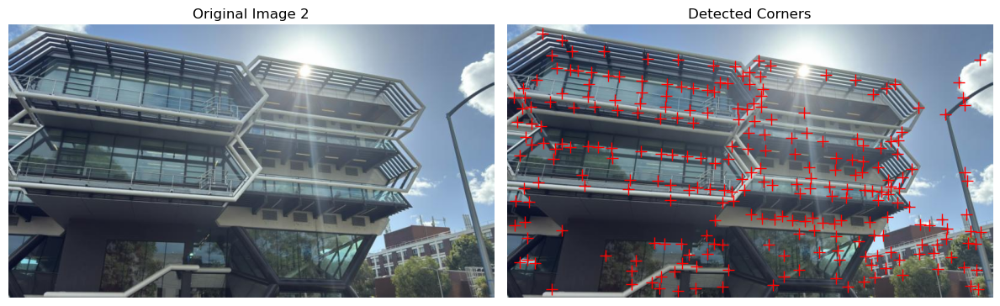

Step 2: Extracting SIFT descriptors...
Step 3: Matching keypoints...
Found 84 good matches after ratio test
Visualizing good matches...


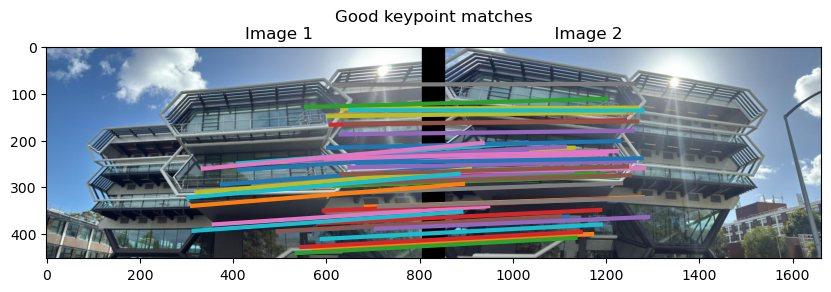

Step 4: Estimating homography with RANSAC...
Iteration 1: 47 inliers, 37 outliers
Iteration 2: 38 inliers, 46 outliers
Iteration 3: 20 inliers, 64 outliers
Iteration 4: 5 inliers, 79 outliers
Iteration 5: 32 inliers, 52 outliers
Iteration 6: 11 inliers, 73 outliers
Iteration 7: 80 inliers, 4 outliers
Iteration 8: 54 inliers, 30 outliers
Iteration 9: 66 inliers, 18 outliers
Iteration 10: 4 inliers, 80 outliers
Iteration 11: 21 inliers, 63 outliers
Iteration 12: 76 inliers, 8 outliers
Iteration 13: 49 inliers, 35 outliers
Iteration 14: 57 inliers, 27 outliers
Iteration 15: 40 inliers, 44 outliers
Iteration 16: 46 inliers, 38 outliers
Iteration 17: 34 inliers, 50 outliers
Iteration 18: 51 inliers, 33 outliers
Iteration 19: 4 inliers, 80 outliers
Iteration 20: 76 inliers, 8 outliers
Iteration 21: 9 inliers, 75 outliers
Iteration 22: 5 inliers, 79 outliers
Iteration 23: 24 inliers, 60 outliers
Iteration 24: 5 inliers, 79 outliers
Iteration 25: 4 inliers, 80 outliers
Iteration 26: 4 inliers,

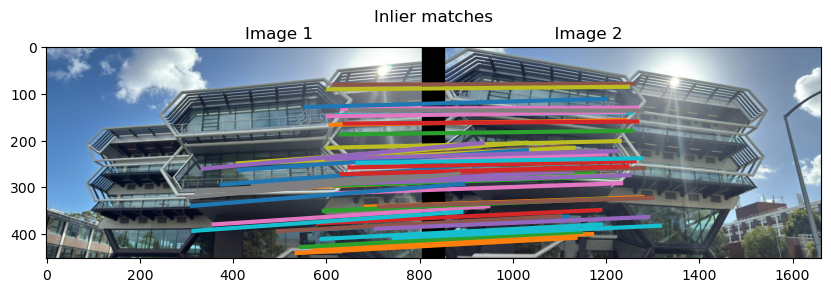

Step 5: Applying warping transformation...
Step 6: Merging images with advanced blending...
Saved stitched image to: stitched_monash.jpg


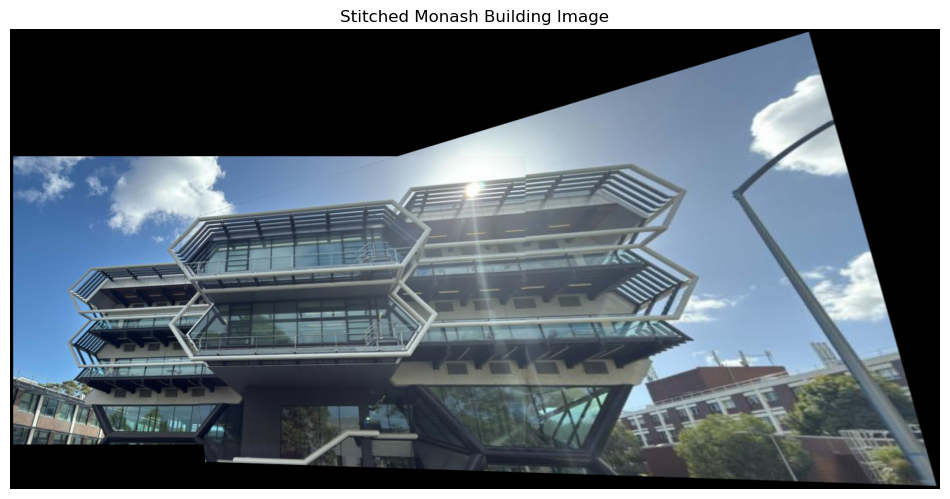

In [23]:
# Test with the required image pairs
print("\nTesting with castle images...")
try:
    castle1 = cv2.imread('castle_1.jpg')
    castle2 = cv2.imread('castle_2.jpg')
    
    castle1_rgb = cv2.cvtColor(castle1, cv2.COLOR_BGR2RGB)
    castle2_rgb = cv2.cvtColor(castle2, cv2.COLOR_BGR2RGB)
    
    stitched_castle = my_image_stitching(castle1_rgb, castle2_rgb, 'stitched_castle.jpg')
    
    plt.figure(figsize=(12, 8))
    plt.imshow(stitched_castle)
    plt.title('Stitched Castle Image')
    plt.axis('off')
    plt.show()
except Exception as e:
    print(f"Error processing castle images: {e}")

print("\nTesting with Singapore images...")
try:
    singapore1 = cv2.imread('singapore_1.jpg')
    singapore2 = cv2.imread('singapore_2.jpg')
    
    singapore1_rgb = cv2.cvtColor(singapore1, cv2.COLOR_BGR2RGB)
    singapore2_rgb = cv2.cvtColor(singapore2, cv2.COLOR_BGR2RGB)
    
    stitched_singapore = my_image_stitching(singapore1_rgb, singapore2_rgb, 'stitched_singapore.jpg')
    
    plt.figure(figsize=(12, 8))
    plt.imshow(stitched_singapore)
    plt.title('Stitched Singapore Image')
    plt.axis('off')
    plt.show()
except Exception as e:
    print(f"Error processing Singapore images: {e}")

print("\nTesting with Monash building images...")
try:
    monash1 = cv2.imread('monash_building_1.jpg')
    monash2 = cv2.imread('monash_building_2.jpg')
    
    monash1_rgb = cv2.cvtColor(monash1, cv2.COLOR_BGR2RGB)
    monash2_rgb = cv2.cvtColor(monash2, cv2.COLOR_BGR2RGB)
    
    stitched_monash = my_image_stitching(monash1_rgb, monash2_rgb, 'stitched_monash.jpg')
    
    plt.figure(figsize=(12, 8))
    plt.imshow(stitched_monash)
    plt.title('Stitched Monash Building Image')
    plt.axis('off')
    plt.show()
except Exception as e:
    print(f"Error processing Monash building images: {e}")

=========================== End ===========================